<a href="https://colab.research.google.com/github/chauminhnguyen/OCR/blob/main/CRAFT%2BStarNet%2BMORAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !pip install torch==1.3.1
# !pip install torchvision==0.4.2
# !pip install opencv-python==3.4.2.17
# !pip install scikit-image==0.14.2
# !pip install scipy==1.1.0
# !pip install Pillow==6.1

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
% cd /content/gdrive/MyDrive/StarNet+Craft
!python pipeline.py --trained_model=./CRAFT/model/craft_mlt_25k.pth --test_folder=/content/gdrive/MyDrive/StarNet+Craft/test

/content/gdrive/MyDrive/StarNet+Craft
Loading weights from checkpoint (./CRAFT/model/craft_mlt_25k.pth)
elapsed time : 5.587008953094482s


In [ ]:
!python crop_images.py

## StarNET

model input parameters 32 100 20 1 512 256 37 25 TPS ResNet BiLSTM CTC
loading pretrained model from /content/gdrive/MyDrive/StarNet+Craft/deep-text-recognition-benchmark/models/TPS-ResNet-BiLSTM-CTC.pth


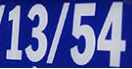

13754                    	 confidence: 0.4211



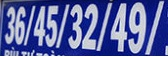

361481321491             	 confidence: 0.0071



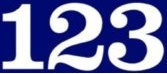

123                      	 confidence: 0.7238



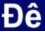

de                       	 confidence: 0.8271



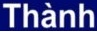

thanh                    	 confidence: 0.9834



la                       	 confidence: 0.9965



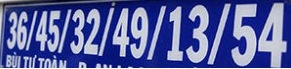

massx14n13754            	 confidence: 0.0000



but                      	 confidence: 0.7901



tun                      	 confidence: 0.4071



toant                    	 confidence: 0.4366



p                        	 confidence: 0.9742



an                       	 confidence: 0.8792



lac                      	 confidence: 0.9994



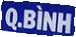

qbinh                    	 confidence: 0.3985



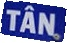

tanj                     	 confidence: 0.6740



bull                     	 confidence: 0.6035



tul                      	 confidence: 0.4910



toan                     	 confidence: 0.7047



p                        	 confidence: 0.9703



an                       	 confidence: 0.9218



lac                      	 confidence: 0.9983



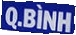

qbinh                    	 confidence: 0.3395



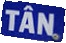

tanj                     	 confidence: 0.6417



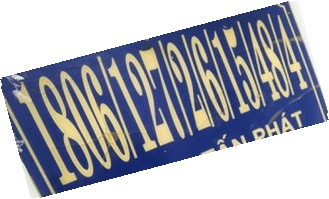

ne0g1rtieoigisy          	 confidence: 0.0000



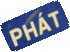

phat                     	 confidence: 0.6804



be                       	 confidence: 0.9151



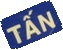

tan                      	 confidence: 0.4541



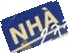

iha                      	 confidence: 0.1101



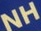

nh                       	 confidence: 0.9755



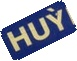

huy                      	 confidence: 0.6776



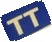

ty                       	 confidence: 0.0006



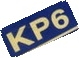

kpg                      	 confidence: 0.8467



kenhiavn                 	 confidence: 0.0492



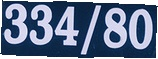

334780                   	 confidence: 0.6640



chu                      	 confidence: 0.6587



van                      	 confidence: 0.6883



any                      	 confidence: 0.6227



p12                      	 confidence: 0.2051



qbt                      	 confidence: 0.9937



so                       	 confidence: 0.6209



15a                      	 confidence: 0.5460



cui                      	 confidence: 0.9872



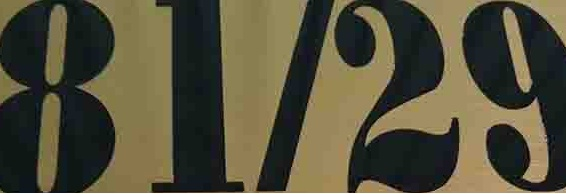

31729                    	 confidence: 0.0589



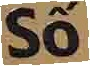

so                       	 confidence: 0.8794



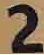

2                        	 confidence: 0.9932



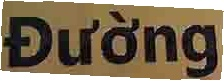

dudng                    	 confidence: 0.5094



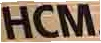

hcm                      	 confidence: 0.7089



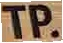

tp                       	 confidence: 0.9085



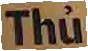

thu                      	 confidence: 0.9001



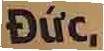

duc                      	 confidence: 0.9471



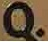

q                        	 confidence: 0.9567



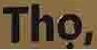

tho                      	 confidence: 0.6837



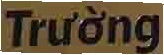

truing                   	 confidence: 0.2239



a                        	 confidence: 0.5747



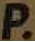

p                        	 confidence: 0.8705



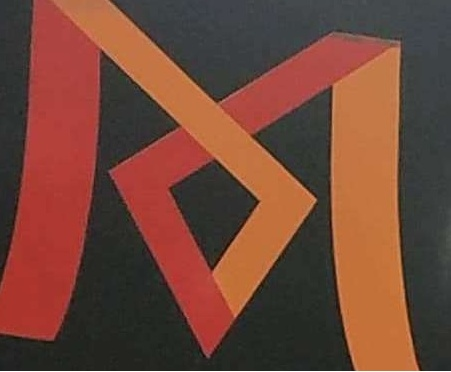

ki                       	 confidence: 0.0292



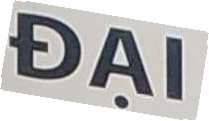

dai                      	 confidence: 0.4290



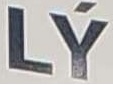

ly                       	 confidence: 0.7601



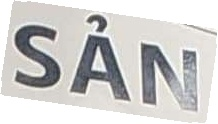

san                      	 confidence: 0.5055



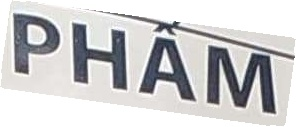

pham                     	 confidence: 0.9257



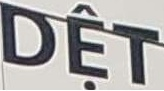

det                      	 confidence: 0.9700



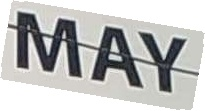

may                      	 confidence: 0.9257



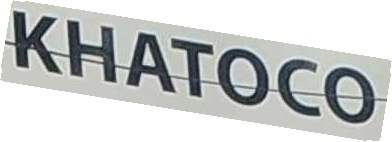

khatoco                  	 confidence: 0.9939



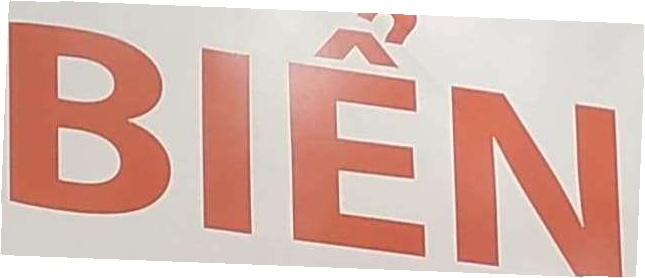

bien                     	 confidence: 0.5782



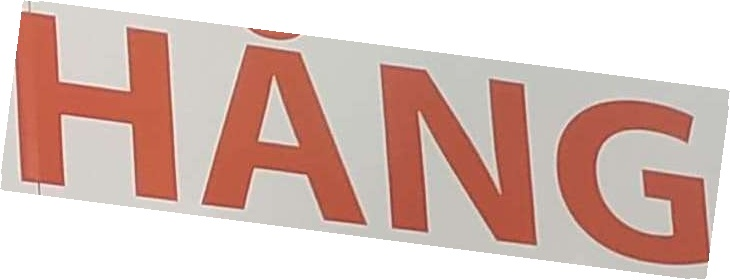

hang                     	 confidence: 0.8322



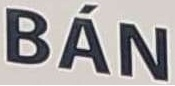

ban                      	 confidence: 0.7908



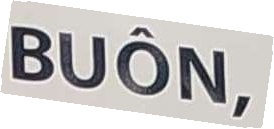

buoni                    	 confidence: 0.3789



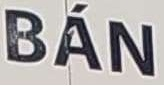

ban                      	 confidence: 0.8549



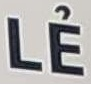

li                       	 confidence: 0.4374



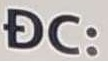

dci                      	 confidence: 0.1871



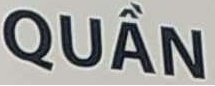

quan                     	 confidence: 0.6155



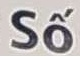

so                       	 confidence: 0.8191



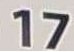

17                       	 confidence: 0.9982



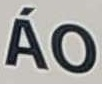

ao                       	 confidence: 0.9874



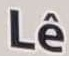

le                       	 confidence: 0.9793



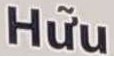

huu                      	 confidence: 0.9851



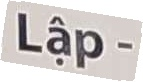

lap                      	 confidence: 0.6871



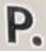

p                        	 confidence: 0.9637



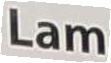

lam                      	 confidence: 0.9767



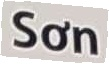

son                      	 confidence: 0.7533



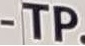

tp                       	 confidence: 0.5286



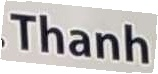

thanh                    	 confidence: 0.6280



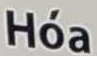

hoa                      	 confidence: 0.9959



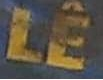

le                       	 confidence: 0.9124



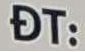

dts                      	 confidence: 0.6264



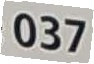

037                      	 confidence: 0.3201



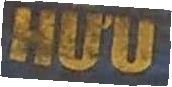

huu                      	 confidence: 0.4773



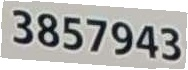

3857943                  	 confidence: 0.9381



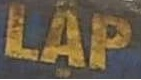

lap                      	 confidence: 0.9914



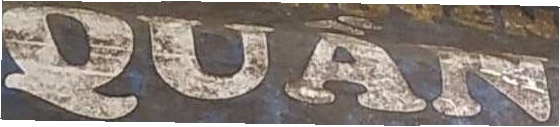

duan                     	 confidence: 0.2780



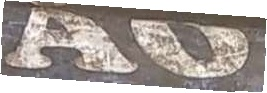

ad                       	 confidence: 0.3607



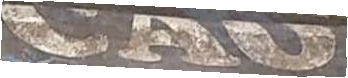

sa                       	 confidence: 0.0000



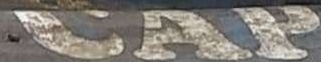

gap                      	 confidence: 0.1896



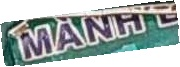

mante                    	 confidence: 0.0197



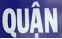

quan                     	 confidence: 0.7075



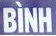

binh                     	 confidence: 0.9854



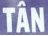

tan                      	 confidence: 0.8192



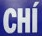

chi                      	 confidence: 0.9355



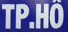

tpho                     	 confidence: 0.6719



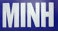

minh                     	 confidence: 0.9751



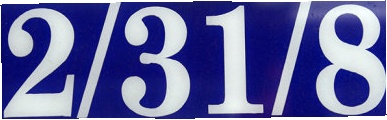

23178                    	 confidence: 0.1348



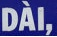

dai                      	 confidence: 0.6040



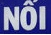

noi                      	 confidence: 0.9794



pan                      	 confidence: 0.8373



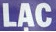

lac                      	 confidence: 0.9938



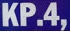

kp4                      	 confidence: 0.6589



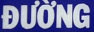

duong                    	 confidence: 0.9730



2d                       	 confidence: 0.9876



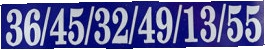

363324918155             	 confidence: 0.0000



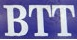

btt                      	 confidence: 0.7954



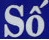

so                       	 confidence: 0.6369



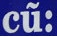

cui                      	 confidence: 0.8197



In [ ]:
import sys
sys.path.append('./deep-text-recognition-benchmark')

import string
import argparse

import torch
import torch.backends.cudnn as cudnn
import torch.utils.data
import torch.nn.functional as F

from utils import CTCLabelConverter, AttnLabelConverter
from dataset import RawDataset, AlignCollate
from model import Model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

import pandas as pd
import os

import cv2
from google.colab.patches import cv2_imshow


def demo(opt):


    """Open csv file wherein you are going to write the Predicted Words"""
    data = pd.read_csv('/content/data.csv')

    """ model configuration """
    if 'CTC' in opt.Prediction:
        converter = CTCLabelConverter(opt.character)
    else:
        converter = AttnLabelConverter(opt.character)
    opt.num_class = len(converter.character)

    if opt.rgb:
        opt.input_channel = 3
    model = Model(opt)
    print('model input parameters', opt.imgH, opt.imgW, opt.num_fiducial, opt.input_channel, opt.output_channel,
          opt.hidden_size, opt.num_class, opt.batch_max_length, opt.Transformation, opt.FeatureExtraction,
          opt.SequenceModeling, opt.Prediction)
    model = torch.nn.DataParallel(model).to(device)

    # load model
    print('loading pretrained model from %s' % opt.saved_model)
    model.load_state_dict(torch.load(opt.saved_model, map_location=device))

    # prepare data. two demo images from https://github.com/bgshih/crnn#run-demo
    AlignCollate_demo = AlignCollate(imgH=opt.imgH, imgW=opt.imgW, keep_ratio_with_pad=opt.PAD)
    demo_data = RawDataset(root=opt.image_folder, opt=opt)  # use RawDataset
    demo_loader = torch.utils.data.DataLoader(
        demo_data, batch_size=opt.batch_size,
        shuffle=False,
        num_workers=int(opt.workers),
        collate_fn=AlignCollate_demo, pin_memory=True)

    # predict
    model.eval()
    with torch.no_grad():
        for image_tensors, image_path_list in demo_loader:
            batch_size = image_tensors.size(0)
            image = image_tensors.to(device)
            # For max length prediction
            length_for_pred = torch.IntTensor([opt.batch_max_length] * batch_size).to(device)
            text_for_pred = torch.LongTensor(batch_size, opt.batch_max_length + 1).fill_(0).to(device)

            if 'CTC' in opt.Prediction:
                preds = model(image, text_for_pred)

                # Select max probabilty (greedy decoding) then decode index to character
                preds_size = torch.IntTensor([preds.size(1)] * batch_size)
                _, preds_index = preds.max(2)
                # preds_index = preds_index.view(-1)
                preds_str = converter.decode(preds_index.data, preds_size.data)

            else:
                preds = model(image, text_for_pred, is_train=False)

                # select max probabilty (greedy decoding) then decode index to character
                _, preds_index = preds.max(2)
                preds_str = converter.decode(preds_index, length_for_pred)

            dashed_line = '-' * 80
            # head = f'{"image_path":25s}\t {"predicted_labels":25s}\t confidence score'
            
            # print(f'{dashed_line}\n{head}\n{dashed_line}')
            # log.write(f'{dashed_line}\n{head}\n{dashed_line}\n')

            preds_prob = F.softmax(preds, dim=2)
            preds_max_prob, _ = preds_prob.max(dim=2)
            for img_name, pred, pred_max_prob in zip(image_path_list, preds_str, preds_max_prob):
                
                start = '/content/Result/Crop Words/'
                path = os.path.relpath(img_name, start)

                folder = os.path.dirname(path)

                image_name=os.path.basename(path)

                file_name='_'.join(image_name.split('_')[:-8])

                txt_file=os.path.join(start, folder, file_name)
                
                log = open(f'{txt_file}_log_demo_result_vgg.txt', 'a')
                if 'Attn' in opt.Prediction:
                    pred_EOS = pred.find('[s]')
                    pred = pred[:pred_EOS]  # prune after "end of sentence" token ([s])
                    pred_max_prob = pred_max_prob[:pred_EOS]

                # calculate confidence score (= multiply of pred_max_prob)
                confidence_score = pred_max_prob.cumprod(dim=0)[-1]
                imgcropped = cv2.imread(img_name)
                cv2_imshow(imgcropped)
                print(f'{pred:25s}\t confidence: {confidence_score:0.4f}\n')
                # print(f'{image_name:25s}\t {pred:25s}\t {confidence_score:0.4f}')
                log.write(f'{image_name:25s}\t {pred:25s}\t {confidence_score:0.4f}\n')

            log.close()
  

if __name__ == '__main__':
    parser = argparse.ArgumentParser()
    parser.add_argument('--image_folder', default='/content/Result/Crop Words', help='path to image_folder which contains text images')
    parser.add_argument('--workers', type=int, help='number of data loading workers', default=4)
    parser.add_argument('--batch_size', type=int, default=192, help='input batch size')
    parser.add_argument('--saved_model', default='/content/gdrive/MyDrive/StarNet+Craft/deep-text-recognition-benchmark/models/TPS-ResNet-BiLSTM-CTC.pth', help="path to saved_model to evaluation")
    """ Data processing """
    parser.add_argument('--batch_max_length', type=int, default=25, help='maximum-label-length')
    parser.add_argument('--imgH', type=int, default=32, help='the height of the input image')
    parser.add_argument('--imgW', type=int, default=100, help='the width of the input image')
    parser.add_argument('--rgb', action='store_true', help='use rgb input')
    parser.add_argument('--character', type=str, default='0123456789abcdefghijklmnopqrstuvwxyz', help='character label')
    parser.add_argument('--sensitive', action='store_true', help='for sensitive character mode')
    parser.add_argument('--PAD', action='store_true', help='whether to keep ratio then pad for image resize')
    """ Model Architecture """
    parser.add_argument('--Transformation', type=str, default='TPS', help='Transformation stage. None|TPS')
    parser.add_argument('--FeatureExtraction', type=str, default='ResNet', help='FeatureExtraction stage. VGG|RCNN|ResNet')
    parser.add_argument('--SequenceModeling', type=str, default='BiLSTM', help='SequenceModeling stage. None|BiLSTM')
    parser.add_argument('--Prediction', type=str, default='CTC', help='Prediction stage. CTC|Attn')
    parser.add_argument('--num_fiducial', type=int, default=20, help='number of fiducial points of TPS-STN')
    parser.add_argument('--input_channel', type=int, default=1, help='the number of input channel of Feature extractor')
    parser.add_argument('--output_channel', type=int, default=512,
                        help='the number of output channel of Feature extractor')
    parser.add_argument('--hidden_size', type=int, default=256, help='the size of the LSTM hidden state')

    opt, unknown = parser.parse_known_args()

    """ vocab / character number configuration """
    if opt.sensitive:
        opt.character = string.printable[:-6]  # same with ASTER setting (use 94 char).

    cudnn.benchmark = True
    cudnn.deterministic = True
    opt.num_gpu = torch.cuda.device_count()
    # print (opt.image_folder)

    # pred_words=demo(opt)
    demo(opt)

# % cd /content/gdrive/MyDrive/StarNet+Craft
# !python demo.py \
# --Transformation TPS --FeatureExtraction ResNet --SequenceModeling BiLSTM --Prediction CTC \
# --image_folder '/content/Result/Crop Words'/ \
# --saved_model '/content/gdrive/MyDrive/StarNet+Craft/deep-text-recognition-benchmark/models/TPS-ResNet-BiLSTM-CTC.pth'

## MORANv2

In [ ]:
% cd /content/gdrive/MyDrive/StarNet+Craft/MORAN_v2
!pip install -r requirements.txt

/content/gdrive/MyDrive/StarNet+Craft/MORAN_v2
     |████████████████████████████████| 496.4MB 18kB/s 
     |████████████████████████████████| 61kB 7.6MB/s 
ERROR: fastai 1.0.61 has requirement torch>=1.0.0, but you'll have torch 0.3.1 which is incompatible.
  Found existing installation: torch 1.3.1
    Uninstalling torch-1.3.1:
      Successfully uninstalled torch-1.3.1
  Found existing installation: torchvision 0.4.2
    Uninstalling torchvision-0.4.2:
      Successfully uninstalled torchvision-0.4.2


loading pretrained model from ./demo.pth



Result:
Left to Right: tui
Right to Left: ut




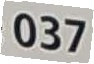


Result:
Left to Right: 037
Right to Left: 730





Result:
Left to Right: kenhiavin
Right to Left: nv41nnek




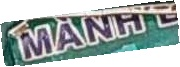


Result:
Left to Right: manage
Right to Left: eranam




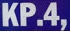


Result:
Left to Right: kp4
Right to Left: 4pk




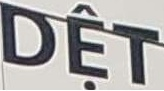


Result:
Left to Right: det
Right to Left: ted




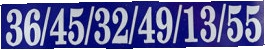


Result:
Left to Right: 364524118155
Right to Left: 5619194235683





Result:
Left to Right: p
Right to Left: p




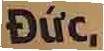


Result:
Left to Right: duc
Right to Left: cud




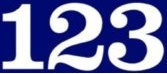


Result:
Left to Right: 123
Right to Left: 321




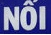


Result:
Left to Right: noi
Right to Left: ion




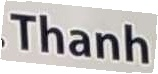


Result:
Left to Right: thanh
Right to Left: hnaht





Result:
Left to Right: qbt
Right to Left: tbq





Result:
Left to Right: but
Right to Left: tub




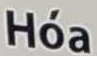


Result:
Left to Right: hoa
Right to Left: aoh




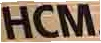


Result:
Left to Right: hcm
Right to Left: mch




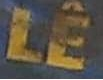


Result:
Left to Right: le
Right to Left: el




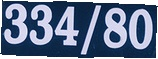


Result:
Left to Right: 33480
Right to Left: 08433




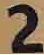


Result:
Left to Right: 2
Right to Left: 2




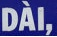


Result:
Left to Right: dai
Right to Left: iad




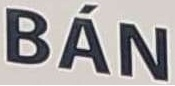


Result:
Left to Right: ban
Right to Left: nab




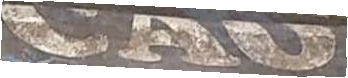


Result:
Left to Right: sad
Right to Left: uas




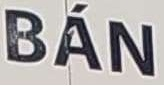


Result:
Left to Right: ban
Right to Left: nab




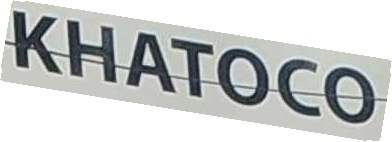


Result:
Left to Right: khatoco
Right to Left: ocotahk





Result:
Left to Right: bull
Right to Left: llub




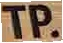


Result:
Left to Right: tp
Right to Left: pt





Result:
Left to Right: toan
Right to Left: naot




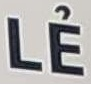


Result:
Left to Right: le
Right to Left: el




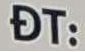


Result:
Left to Right: dt
Right to Left: td




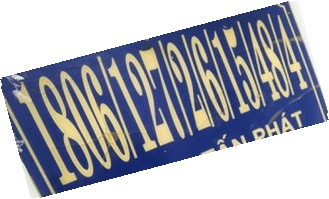


Result:
Left to Right: announced
Right to Left: noitazinagro





Result:
Left to Right: van
Right to Left: nav




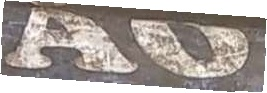


Result:
Left to Right: ad
Right to Left: ua




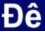


Result:
Left to Right: de
Right to Left: ed




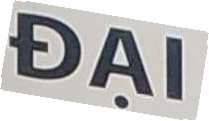


Result:
Left to Right: dai
Right to Left: iad




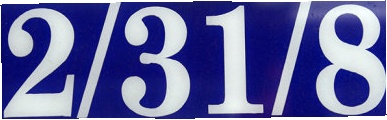


Result:
Left to Right: 2318
Right to Left: 8132




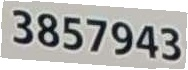


Result:
Left to Right: 3857943
Right to Left: 3497583





Result:
Left to Right: lac
Right to Left: cal




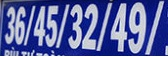


Result:
Left to Right: 364532497
Right to Left: 794235463




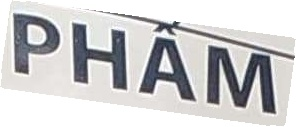


Result:
Left to Right: pham
Right to Left: mahp




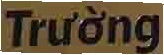


Result:
Left to Right: trudng
Right to Left: gnourt




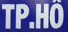


Result:
Left to Right: tpho
Right to Left: ohpt




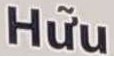


Result:
Left to Right: huu
Right to Left: uuh





Result:
Left to Right: toan
Right to Left: naot





Result:
Left to Right: 15a
Right to Left: a51




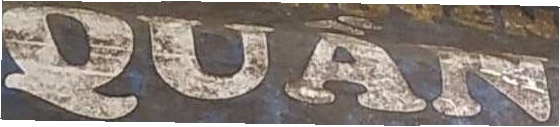


Result:
Left to Right: quan
Right to Left: nauq




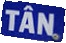


Result:
Left to Right: tanj
Right to Left: jnat




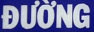


Result:
Left to Right: duong
Right to Left: gnoud




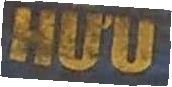


Result:
Left to Right: huu
Right to Left: uuh




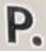


Result:
Left to Right: p
Right to Left: p




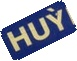


Result:
Left to Right: huy
Right to Left: yuh




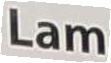


Result:
Left to Right: lam
Right to Left: mal




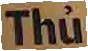


Result:
Left to Right: thu
Right to Left: uht




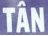


Result:
Left to Right: tan
Right to Left: nat




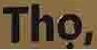


Result:
Left to Right: thq
Right to Left: oht




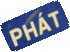


Result:
Left to Right: phat
Right to Left: tahp




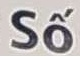


Result:
Left to Right: so
Right to Left: os





Result:
Left to Right: 0
Right to Left: 0





Result:
Left to Right: p127
Right to Left: 721p





Result:
Left to Right: la
Right to Left: al





Result:
Left to Right: lac
Right to Left: cal




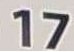


Result:
Left to Right: 17
Right to Left: 71




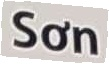


Result:
Left to Right: son
Right to Left: nos




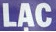


Result:
Left to Right: lac
Right to Left: cal




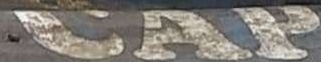


Result:
Left to Right: cap
Right to Left: pac




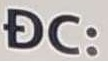


Result:
Left to Right: dc
Right to Left: cd




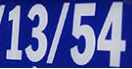


Result:
Left to Right: 1354
Right to Left: 4531





Result:
Left to Right: tu
Right to Left: ut





Result:
Left to Right: cu
Right to Left: uc




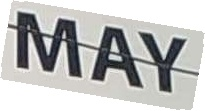


Result:
Left to Right: may
Right to Left: yam





Result:
Left to Right: an
Right to Left: na




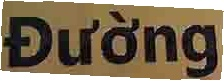


Result:
Left to Right: duong
Right to Left: gnoud





Result:
Left to Right: chu
Right to Left: uhc





Result:
Left to Right: pan
Right to Left: nap




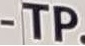


Result:
Left to Right: tp
Right to Left: pt





Result:
Left to Right: so
Right to Left: os




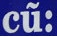


Result:
Left to Right: cu
Right to Left: uc




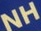


Result:
Left to Right: nh
Right to Left: hn




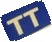


Result:
Left to Right: ttl
Right to Left: ltt




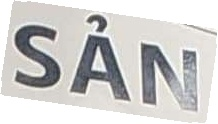


Result:
Left to Right: san
Right to Left: nas





Result:
Left to Right: p
Right to Left: p




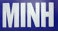


Result:
Left to Right: minh
Right to Left: hnim




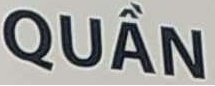


Result:
Left to Right: quan
Right to Left: nauq




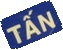


Result:
Left to Right: tan
Right to Left: nat




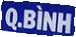


Result:
Left to Right: qbinh
Right to Left: hnibo





Result:
Left to Right: an
Right to Left: na





Result:
Left to Right: be
Right to Left: eb





Result:
Left to Right: an
Right to Left: yna




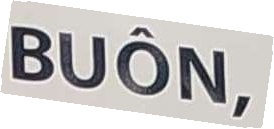


Result:
Left to Right: buon
Right to Left: noub




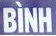


Result:
Left to Right: binh
Right to Left: hnib




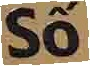


Result:
Left to Right: so
Right to Left: os




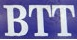


Result:
Left to Right: btt
Right to Left: ttb




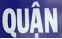


Result:
Left to Right: quan
Right to Left: nauq




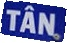


Result:
Left to Right: tanj
Right to Left: jnat




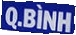


Result:
Left to Right: qbinh
Right to Left: hnibq




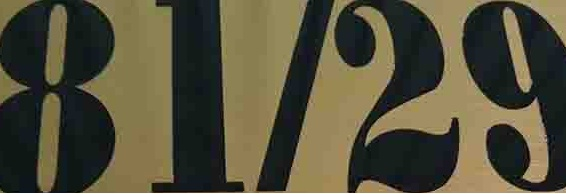


Result:
Left to Right: 31229
Right to Left: 9213




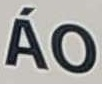


Result:
Left to Right: ao
Right to Left: oa




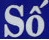


Result:
Left to Right: so
Right to Left: os




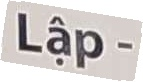


Result:
Left to Right: lap
Right to Left: pal




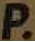


Result:
Left to Right: p
Right to Left: p




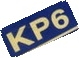


Result:
Left to Right: kp6
Right to Left: 6pk





Result:
Left to Right: 2d
Right to Left: d2




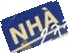


Result:
Left to Right: nhl
Right to Left: ahni




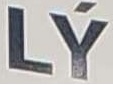


Result:
Left to Right: lv
Right to Left: vl




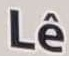


Result:
Left to Right: le
Right to Left: el




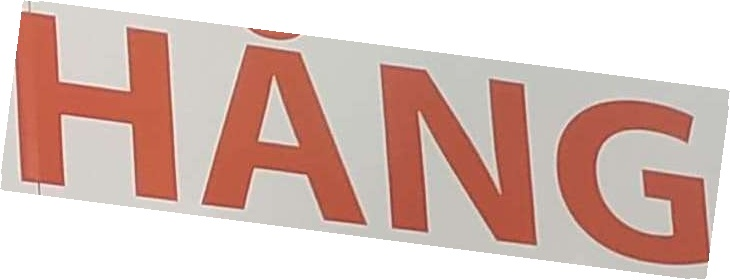


Result:
Left to Right: hang
Right to Left: gnah




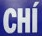


Result:
Left to Right: chi
Right to Left: ihc




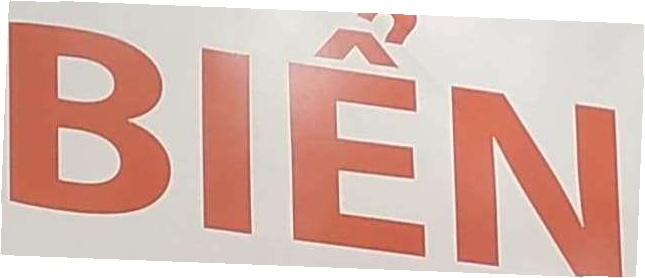


Result:
Left to Right: bien
Right to Left: neib




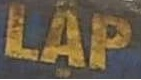


Result:
Left to Right: lap
Right to Left: pal




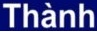


Result:
Left to Right: thanh
Right to Left: hnaht




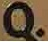


Result:
Left to Right: q
Right to Left: q




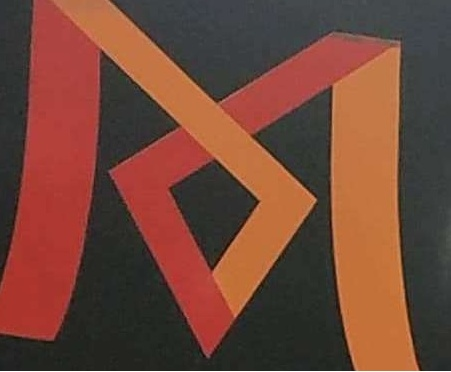


Result:
Left to Right: 11
Right to Left: 11




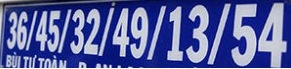


Result:
Left to Right: emenzagi354
Right to Left: 453194231410




In [ ]:
import torch
from torch.autograd import Variable
import tools.utils as utils
import tools.dataset as dataset
import cv2
from PIL import Image
from collections import OrderedDict
from google.colab.patches import cv2_imshow
from models.moran import MORAN
import os

model_path = './demo.pth'
# img_path = './demo/0.png'
alphabet = '0:1:2:3:4:5:6:7:8:9:a:b:c:d:e:f:g:h:i:j:k:l:m:n:o:p:q:r:s:t:u:v:w:x:y:z:$'

cuda_flag = False
if torch.cuda.is_available():
    cuda_flag = True
    MORAN = MORAN(1, len(alphabet.split(':')), 256, 32, 100, BidirDecoder=True, CUDA=cuda_flag)
    MORAN = MORAN.cuda()
else:
    MORAN = MORAN(1, len(alphabet.split(':')), 256, 32, 100, BidirDecoder=True, inputDataType='torch.FloatTensor', CUDA=cuda_flag)

print('loading pretrained model from %s' % model_path)
if cuda_flag:
    state_dict = torch.load(model_path)
else:
    state_dict = torch.load(model_path, map_location='cpu')
MORAN_state_dict_rename = OrderedDict()
for k, v in state_dict.items():
    name = k.replace("module.", "") # remove `module.`
    MORAN_state_dict_rename[name] = v
MORAN.load_state_dict(MORAN_state_dict_rename)

for p in MORAN.parameters():
    p.requires_grad = False
MORAN.eval()

converter = utils.strLabelConverterForAttention(alphabet, ':')
transformer = dataset.resizeNormalize((100, 32))

test_folder = '/content/Result/Crop Words/'
img_paths = os.listdir(test_folder)

for img_path in img_paths:
    if img_path.split('.')[-1] == 'txt':
        continue
    image1 = cv2.imread(test_folder + img_path)
    cv2_imshow(image1)

    image = Image.open(test_folder + img_path).convert('L')

    image = transformer(image)

    if cuda_flag:
        image = image.cuda()
    image = image.view(1, *image.size())
    image = Variable(image)
    text = torch.LongTensor(1 * 5)
    length = torch.IntTensor(1)
    text = Variable(text)
    length = Variable(length)

    max_iter = 20
    t, l = converter.encode('0'*max_iter)
    utils.loadData(text, t)
    utils.loadData(length, l)
    output = MORAN(image, length, text, text, test=True, debug=True)

    preds, preds_reverse = output[0]
    demo = output[1]

    _, preds = preds.max(1)
    _, preds_reverse = preds_reverse.max(1)

    sim_preds = converter.decode(preds.data, length.data)
    sim_preds = sim_preds.strip().split('$')[0]
    sim_preds_reverse = converter.decode(preds_reverse.data, length.data)
    sim_preds_reverse = sim_preds_reverse.strip().split('$')[0]
    # print(img_path)
    print('\nResult:\n' + 'Left to Right: ' + sim_preds + '\nRight to Left: ' + sim_preds_reverse + '\n\n')

    # cv2_imshow(demo)
# cv2.waitKey()

## VietOCR

In [ ]:
!pip install vietocr==0.3.2

     |████████████████████████████████| 61kB 4.6MB/s 
     |████████████████████████████████| 952kB 13.9MB/s 
     |████████████████████████████████| 880kB 49.6MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-3.11.0-cp36-none-any.whl size=9619 sha256=bd9c64457eed0fde1961dfa629d673427a49f095387367557e2699cd5a5587c4
  Stored in directory: /root/.cache/pip/wheels/19/a6/67/ebb80360fc57bb0ddd5da77f57b275084cd8838bf7d5b91685
Successfully built gdown
  Created wheel for lmdb: filename=lmdb-1.0.0-cp36-cp36m-linux_x86_64.whl size=221145 sha256=28a26a467542cae309389af820d61d5f05702eea3927fd3f4c5ee28358d1990f
  Stored in directory: /root/.cache/pip/wheels/a6/cc/89/00971430afdc0a1db532f44523422eda47ec5a0f1a8c5647f6
Successfully built lmdb
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.4.0 which is incompatible.
  Found existing in

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

from vietocr.tool.predictor import Predictor
from vietocr.tool.config import Cfg

In [ ]:
config = Cfg.load_config_from_name('vgg_transformer')

Change weights to your weights or using default weights from our pretrained model. Path can be url or local file

In [ ]:
# config['weights'] = './weights/transformerocr.pth'
# config['weights'] = 'https://drive.google.com/uc?id=13327Y1tz1ohsm5YZMyXVMPIOjoOA0OaA'
config['cnn']['pretrained']=False
config['device'] = 'cuda:0'
config['predictor']['beamsearch']=False

In [ ]:
detector = Predictor(config)

Cached Downloading: /root/.cache/gdown/https-COLON--SLASH--SLASH-drive.google.com-SLASH-uc-QUESTION-id-EQUAL-13327Y1tz1ohsm5YZMyXVMPIOjoOA0OaA
Downloading...
From: https://drive.google.com/uc?id=13327Y1tz1ohsm5YZMyXVMPIOjoOA0OaA
To: /root/.cache/gdown/tmp_4q0z9h8/dl
152MB [00:01, 109MB/s] 


In [ ]:
! gdown --id 1uMVd6EBjY4Q0G2IkU5iMOQ34X0bysm0b
! unzip  -qq -o sample.zip

Downloading...
From: https://drive.google.com/uc?id=1uMVd6EBjY4Q0G2IkU5iMOQ34X0bysm0b
To: /content/gdrive/My Drive/StarNet+Craft/sample.zip
100% 306k/306k [00:00<00:00, 96.4MB/s]


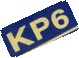

Kpa


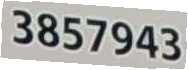

3857943


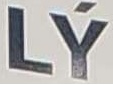

LY


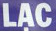

LAC


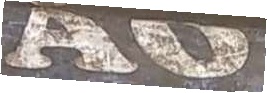

FLAT


P12


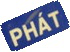

PHAT


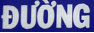

ĐƯỜNG


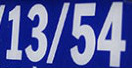

13/54


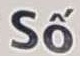

Số


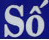

Số


cũ:


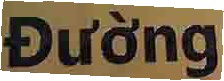

Đường


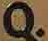

Q


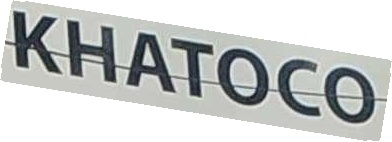

KHATOCO


AN


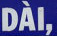

DÀI


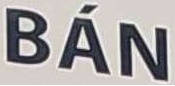

BAN


0


CHU


P.AN


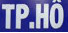

TP HỒ


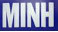

MINH


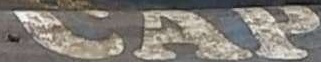

031000001992


TƯ


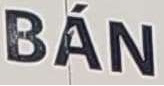

BAN


QBT


LAC


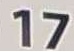

17


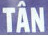

TÂN


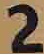

2


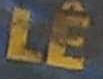

LG


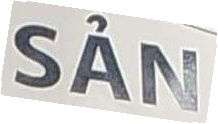

SẢN


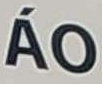

ÁO


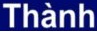

Thành


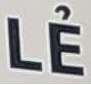

LÊ


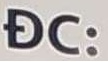

ĐC:


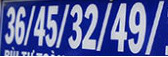

3/45/32/491


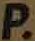

P


P


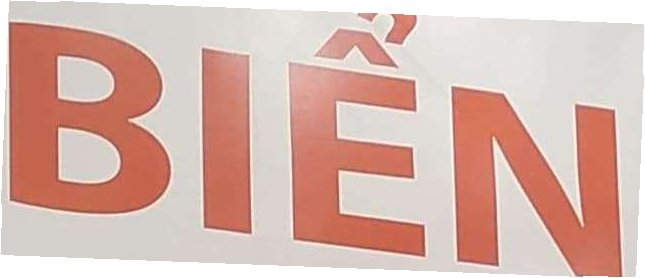

BIẾN


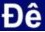

Đê


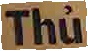

Thủ


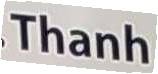

Thanh


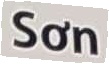

Sơn


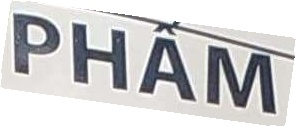

PHAM


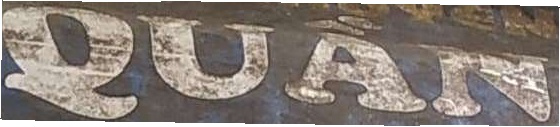

QUAN


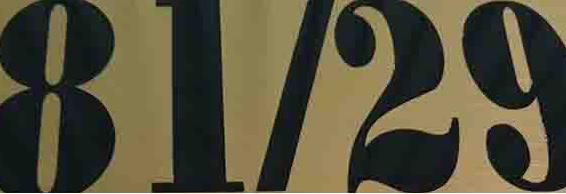

8129


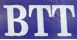

BTT


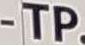

-TP


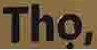

Thọ


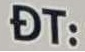

ĐT:


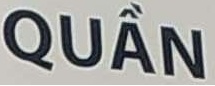

QUÂN


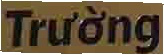

Trường


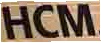

HCM


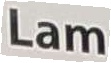

Lam


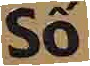

Số


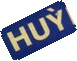

HUY


AN


VĂN


BE


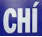

CHÍ


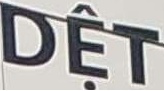

DỆT


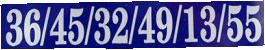

36/152/49/13/55


TƯ


BUIT


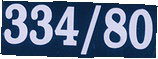

334/80


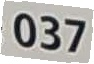

037


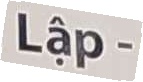

Lập


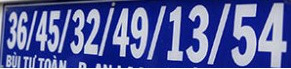

19/32/49/13/54


AN


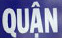

QUẬN


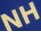

NH


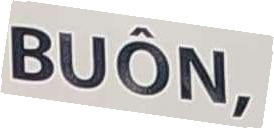

BUON


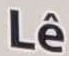

Lê


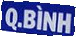

Q.BÌNH


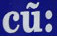

cũ:


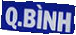

Q.BÌNH


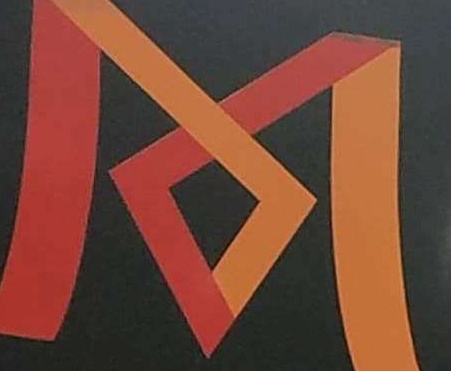

M


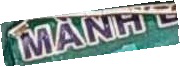

MANITE


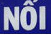

NỐI


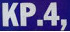

KP4


Kenhizion


số


TOÀN


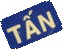

TAN


15A


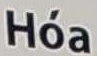

Hóa


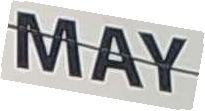

MAY


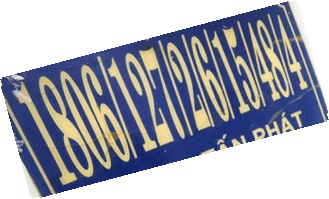

Winning


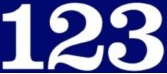

123


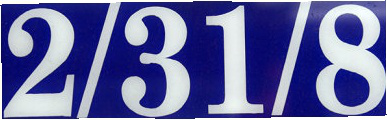

231/8


TOÀN


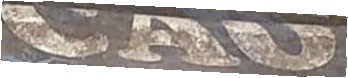

MANIANS


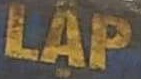

LAP


Bùi


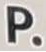

P.


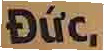

Đức


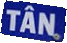

TÂN


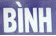

BÌNH


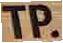

TP


La


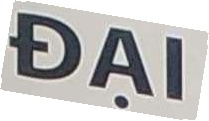

ĐẠI


P


2D


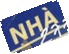

Inha


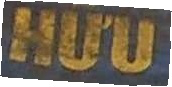

HƯU


LAC


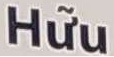

Hữu


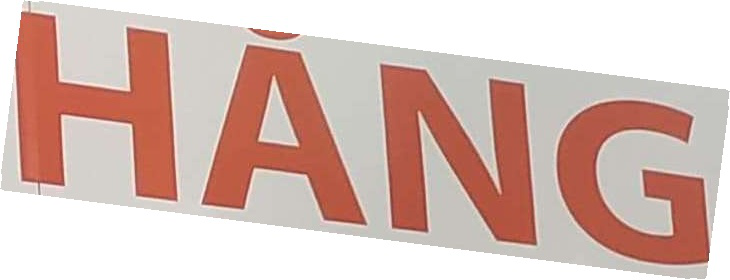

HANG


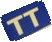

TT


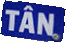

TÂN


In [ ]:
import os

data_path = '/content/Result/Crop Words/'
imgs_path = os.listdir(data_path)
for img_path in imgs_path:
    img = Image.open(os.path.join(data_path, img_path))
    display(img)
    s = detector.predict(img)
    print(s)

## EasyOCR

In [ ]:
!pip install easyocr

     |████████████████████████████████| 57.2MB 57kB/s 


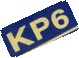

[([[-3.9223227027636804, 30.215535459447263], [69.75236633203717, -1.9024954046937395], [82.92232270276368, 29.784464540552737], [9.247633667962834, 61.90249540469374]], 'KP6', 0.47512945532798767)]


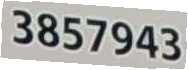

[([[10.05939473479575, -2.9258131707867774], [192.94357340474468, 21.17906444685847], [182.94060526520425, 71.92581317078678], [0.05642659525532512, 47.82093555314153]], '3857943', 0.46321341395378113)]


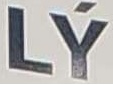

[([[0, 0], [111, 0], [111, 85], [0, 85]], 'LV', 0.31200316548347473)]


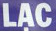

[([[0, 0], [56, 0], [56, 32], [0, 32]], 'LAC', 0.558085560798645)]


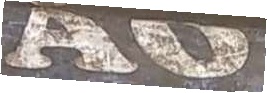

[]


[([[0, 0], [36, 0], [36, 24], [0, 24]], 'Pi2,', 0.6257763504981995)]


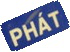

[([[-1.9801487608399566, 26.601985123916005], [61.679075081110426, -0.9702788942746032], [74.98014876083995, 28.398014876083995], [10.320924918889574, 55.9702788942746]], 'PHÁT', 0.844863772392273)]


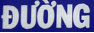

[([[0, 0], [94, 0], [94, 33], [0, 33]], 'DUONG', 0.5203651785850525)]


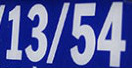

[([[0, 0], [132, 0], [132, 69], [0, 69]], '13/54', 0.8813974261283875)]


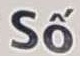

[([[1, 1], [80, 1], [80, 57], [1, 57]], 'Sô', 0.8708382248878479)]


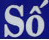

[([[0, 0], [49, 0], [49, 40], [0, 40]], 'Sô', 0.5670408606529236)]


[([[0, 0], [48, 0], [48, 23], [0, 23]], 'C0:', 0.1463066041469574)]


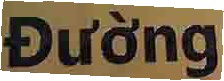

[([[0, 0], [224, 0], [224, 81], [0, 81]], 'Duòng', 0.9848400354385376)]


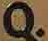

[]


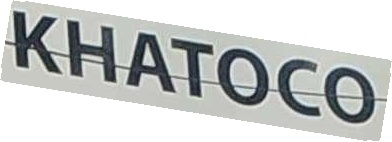

[([[12.244588872706098, -8.971426880279498], [394.9987731399392, 63.84336125629338], [374.7554111272939, 142.9714268802795], [-7.998773139939219, 70.15663874370662]], 'KHATOCO', 0.9409276843070984)]


[([[0, 0], [23, 0], [23, 22], [0, 22]], 'AN', 0.9884924292564392)]


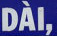

[([[0, 1], [57, 1], [57, 37], [0, 37]], 'DAl,', 0.3170369863510132)]


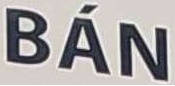

[([[9.895684739251534, -15.93883734673619], [187.60487511600147, 10.216769142522306], [171.10431526074848, 93.9388373467362], [-7.604875116001455, 66.78323085747769]], 'BÁN', 0.9624475240707397)]


[]


[([[0, 0], [35, 0], [35, 20], [0, 20]], 'CHU', 0.9950709939002991)]


[([[0, 0], [63, 0], [63, 29], [0, 29]], 'PAN', 0.8239345550537109)]


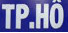

[([[0, 0], [68, 0], [68, 33], [0, 33]], 'TPHO', 0.7417296767234802)]


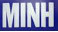

[([[0, 0], [58, 0], [58, 32], [0, 32]], 'MNI', 0.10057804733514786)]


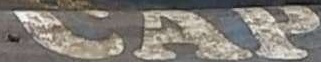

[]


[]


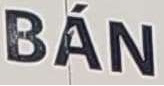

[([[0, 0], [164, 0], [164, 86], [0, 86]], 'BÁN', 0.8693709969520569)]


[([[1, 0], [39, 0], [39, 19], [1, 19]], 'QBT', 0.5652360916137695)]


[([[0, 0], [37, 0], [37, 25], [0, 25]], 'LAC', 0.9968615174293518)]


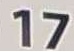

[([[6, 4], [74, 4], [74, 52], [6, 52]], '17', 0.8640275001525879)]


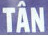

[([[0, 0], [48, 0], [48, 36], [0, 36]], 'TÂN', 0.3440251648426056)]


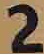

[([[0, 0], [44, 0], [44, 55], [0, 55]], '2', 0.7980427145957947)]


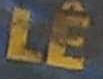

[([[0, 0], [103, 0], [103, 79], [0, 79]], 'L_', 0.24402391910552979)]


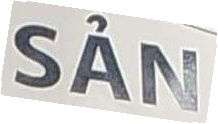

[([[0, 8], [215, 8], [215, 116], [0, 116]], 'SÁN', 0.8219073414802551)]


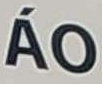

[([[5.883687388697123, -8.930500890423009], [111.9724838175214, 7.823937047964981], [96.11631261130287, 88.930500890423], [-8.972483817521399, 71.17606295203502]], 'ÁO', 0.9938429594039917)]


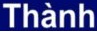

[([[2, 0], [97, 0], [97, 32], [2, 32]], 'Thành', 0.9513037800788879)]


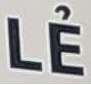

[([[0, 0], [91, 0], [91, 85], [0, 85]], 'LÉ', 0.8701571226119995)]


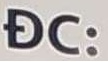

[([[1.980558500954123, -1.9127606944660878], [113.69730507503404, 13.118321259621784], [104.01944149904588, 67.91276069446609], [-6.697305075034041, 52.88167874037821]], 'DC:', 0.5770939588546753)]


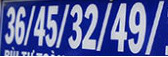

[([[0, 0], [168, 0], [168, 57], [0, 57]], '30/|!5/32|49/', 0.014138642698526382)]


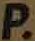

[([[0, 1], [35, 1], [35, 42], [0, 42]], 'E', 0.5575884580612183)]


[]


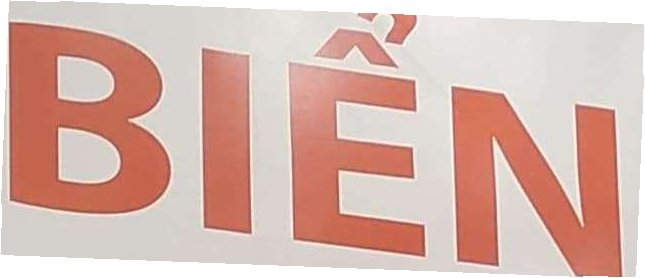

[([[48.905276867999575, -39.98066463561205], [673.1000671813983, 48.58474844153559], [620.0947231320005, 304.9806646356121], [-4.100067181398302, 215.4152515584644]], 'BIÊN', 0.9237481951713562)]


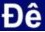

[([[0, 0], [45, 0], [45, 32], [0, 32]], 'Dê', 0.9975918531417847)]


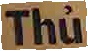

[([[0, 0], [88, 0], [88, 51], [0, 51]], 'TThú', 0.3710770308971405)]


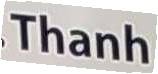

[([[9.951362344004036, -0.9210085295733661], [166.85542749237695, 21.584685937057664], [155.04863765599598, 78.92100852957337], [-1.8554274923769452, 56.415314062942336]], 'Thanh', 0.9052219390869141)]


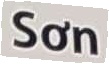

[([[9.926687370800101, -0.9032194605994448], [109.70916365622669, 14.154613767684303], [99.0733126291999, 65.90321946059944], [-0.7091636562266874, 49.8453862323157]], 'Son', 0.9933516979217529)]


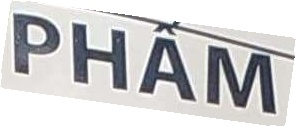

[([[16.060774054043318, -0.9557950271408142], [292.87440631916706, 38.42009498893327], [275.9392259459567, 124.95579502714081], [-1.8744063191670541, 85.57990501106673]], 'PHAM', 0.7712087631225586)]


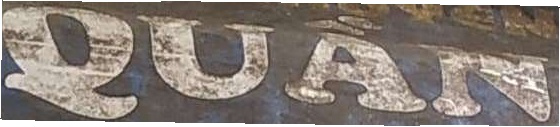

[([[0, 0], [540, 0], [540, 127], [0, 127]], 'DUug', 0.00028928511892445385)]


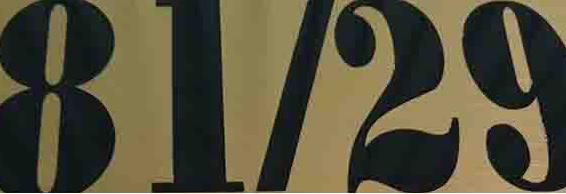

[([[0, 0], [566, 0], [566, 194], [0, 194]], '21929', 0.0022070363629609346)]


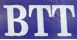

[([[0, 0], [77, 0], [77, 40], [0, 40]], 'BTT', 0.958621621131897)]


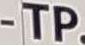

[([[0, 0], [85, 0], [85, 46], [0, 46]], '- TP', 0.3536416292190552)]


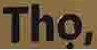

[([[0, 0], [91, 0], [91, 50], [0, 50]], 'Tho', 0.9946755170822144)]


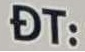

[([[1, 0], [85, 0], [85, 52], [1, 52]], 'DT:', 0.7818529009819031)]


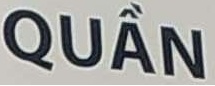

[([[0, 0], [215, 0], [215, 86], [0, 86]], 'QUÂN', 0.8090577721595764)]


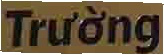

[([[0, 0], [164, 0], [164, 55], [0, 55]], 'Truòng', 0.4715697467327118)]


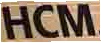

[([[0, 0], [101, 0], [101, 43], [0, 43]], 'HCM', 0.9604572057723999)]


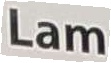

[([[0, 0], [111, 0], [111, 63], [0, 63]], 'Lam', 0.9984079003334045)]


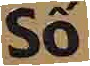

[([[0, 0], [88, 0], [88, 66], [0, 66]], 'Sô', 0.9947823286056519)]


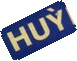

[([[-3.8313051408846057, 28.85060845773462], [64.69069117598525, 1.0402397064162252], [77.83130514088461, 34.149391542265384], [9.30930882401475, 61.95976029358378]], 'HUY', 0.7173933386802673)]


[([[0, 0], [25, 0], [25, 19], [0, 19]], 'AiN', 0.21465472877025604)]


[([[0, 0], [35, 0], [35, 22], [0, 22]], 'VÁN', 0.7037166357040405)]


[([[0, 0], [33, 0], [33, 31], [0, 31]], 'eÊ', 0.39196163415908813)]


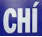

[([[0, 0], [42, 0], [42, 37], [0, 37]], 'CHÍ', 0.966282069683075)]


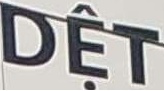

[([[0, 0], [164, 0], [164, 91], [0, 91]], 'DÊT', 0.9875861406326294)]


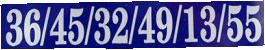

[([[0, 0], [265, 0], [265, 50], [0, 50]], '86|45/32|49/13/55', 0.4404345452785492)]


[]


[]


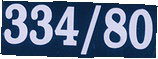

[([[0, 0], [158, 0], [158, 59], [0, 59]], '334/80', 0.8295084238052368)]


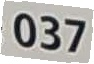

[([[3, 4], [94, 4], [94, 59], [3, 59]], '037', 0.29521703720092773)]


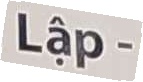

[([[15.852567421448864, -1.9172847920028424], [120.47590187943175, 18.152037379264097], [106.14743257855113, 82.91728479200285], [0.5240981205682553, 63.8479626207359]], 'Lâp', 0.9205121397972107)]


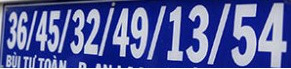

[([[0, 0], [291, 0], [291, 69], [0, 69]], ';0/!5/31|!9/13/54', 0.005373658146709204), ([[5, 53], [41, 53], [41, 69], [5, 69]], 'GullTll', 0.07367786765098572)]


[([[0, 0], [24, 0], [24, 24], [0, 24]], 'AN', 0.9676294326782227)]


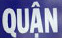

[([[0, 0], [62, 0], [62, 39], [0, 39]], 'QUÂN', 0.42662712931632996)]


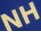

[([[0, 0], [41, 0], [41, 32], [0, 32]], 'NH', 0.9297321438789368)]


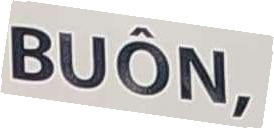

[([[11.916190404858614, 0.05352308907201575], [252.7558265548515, 33.69518002396039], [235.0838095951414, 122.94647691092798], [-6.755826554851504, 89.30481997603961]], 'BUÔN', 0.4309154450893402), ([[228, 90], [252, 90], [252, 118], [228, 118]], '', 0.3269801735877991)]


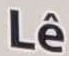

[([[4, 4], [69, 4], [69, 57], [4, 57]], 'Lê', 0.8250106573104858)]


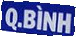

[([[0, 1], [76, 1], [76, 37], [0, 37]], 'QBIN{', 0.035584352910518646)]


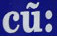

[([[0, 3], [57, 3], [57, 37], [0, 37]], 'cù:', 0.08679579198360443)]


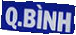

[([[0, 1], [76, 1], [76, 35], [0, 35]], 'QBIN{', 0.05811600759625435)]


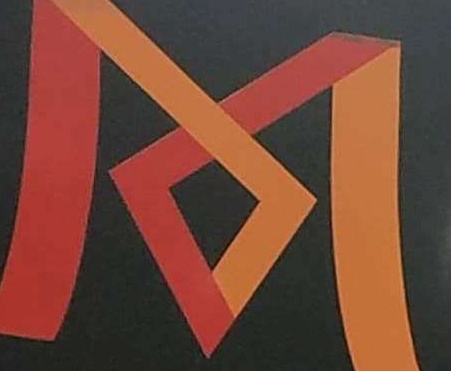

[]


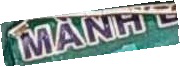

[([[6.512570837685422, 18.11759917275959], [151.31580184407176, -5.78249002775631], [157.48742916231458, 41.88240082724041], [12.684198155928243, 66.78249002775631]], 'LTJLL', 0.0025899456813931465)]


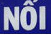

[([[0, 0], [51, 0], [51, 35], [0, 35]], 'NÔI', 0.19905392825603485)]


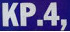

[([[0, 0], [69, 0], [69, 32], [0, 32]], 'KP.4,', 0.810866117477417)]


[([[1, 3], [57, 3], [57, 17], [1, 17]], 'Kenhi4u', 0.5664284229278564)]


[([[0, 0], [38, 0], [38, 22], [0, 22]], 'SÔ', 0.26081934571266174)]


[([[0, 0], [34, 0], [34, 23], [0, 23]], 'TOiN', 0.20880462229251862)]


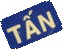

[([[2.4615384615384612, 12.307692307692308], [60.10445600046506, 6.477629499622138], [62.53846153846154, 43.69230769230769], [5.895543999534938, 50.52237050037786]], 'LÂN', 0.2305474728345871)]


[([[0, 0], [68, 0], [68, 26], [0, 26]], '15A', 0.8030863404273987)]


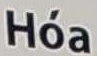

[([[0, 4], [96, 4], [96, 57], [0, 57]], 'Hóa', 0.9976232051849365)]


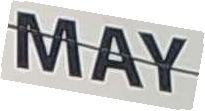

[([[14.016907033180313, -2.946145998059146], [200.82883917187257, 31.253117383105426], [182.9830929668197, 105.94614599805915], [-3.8288391718725716, 71.74688261689457]], 'MAY', 0.48359447717666626)]


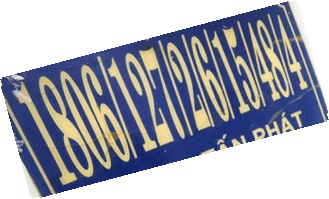

[([[-19.325220563538423, 85.40243383093848], [304.1816314902115, -27.373420565883197], [348.32522056353844, 97.59756616906152], [23.818368509788538, 211.3734205658832]], 'ipinininam', 5.756647442467511e-05), ([[211.54230423844288, 132.27961296691], [305.5195345061671, 102.37152038016029], [313.45769576155715, 128.72038703309], [218.4804654938329, 158.6284796198397]], 'AvLDI!ÁT', 0.012486514635384083)]


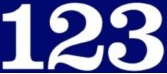

[([[0, 0], [167, 0], [167, 74], [0, 74]], '123', 0.6781386137008667)]


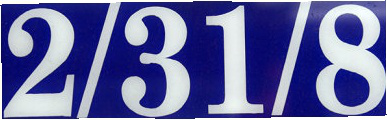

[([[0, 0], [387, 0], [387, 120], [0, 120]], '9|81/8', 0.294567346572876)]


[([[0, 0], [36, 0], [36, 24], [0, 24]], 'coiN', 0.059992026537656784)]


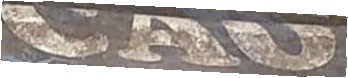

[]


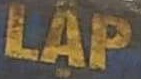

[([[0, 0], [141, 0], [141, 80], [0, 80]], 'LP', 0.20029710233211517)]


[]


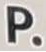

[([[0, 0], [42, 0], [42, 50], [0, 50]], 'P.', 0.9488106369972229)]


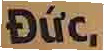

[([[0, 0], [96, 0], [96, 50], [0, 50]], 'Dúc', 0.972568154335022)]


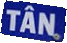

[([[1, 3], [63, 3], [63, 41], [1, 41]], 'IÂN', 0.563457190990448)]


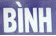

[([[0, 1], [56, 1], [56, 36], [0, 36]], 'BINH', 0.2514553964138031)]


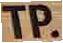

[([[0, 0], [63, 0], [63, 43], [0, 43]], 'TP.', 0.5672159790992737)]


[([[0, 0], [39, 0], [39, 29], [0, 29]], 'La', 0.9814503788948059)]


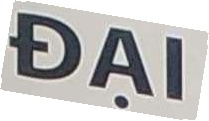

[([[13.963939157405441, -0.9461840889077777], [206.70142500145332, 30.57464374963667], [189.03606084259457, 114.94618408890778], [-4.70142500145332, 83.42535625036334]], 'DAl', 0.6879578232765198)]


[]


[([[0, 0], [39, 0], [39, 30], [0, 30]], '2D', 0.7832157611846924)]


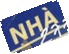

[([[7, 13], [51, 13], [51, 51], [7, 51]], 'MH', 0.25221768021583557)]


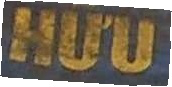

[([[0, 0], [171, 0], [171, 87], [0, 87]], 'AUU', 0.01373384054750204)]


[([[0, 0], [37, 0], [37, 25], [0, 25]], 'LAC', 0.9959391951560974)]


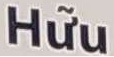

[([[4.902627190595042, -9.91344869925124], [124.6463941255486, 6.803310416132243], [113.09737280940496, 66.91344869925123], [-6.646394125548597, 50.19668958386776]], 'Hùu', 0.30631449818611145)]


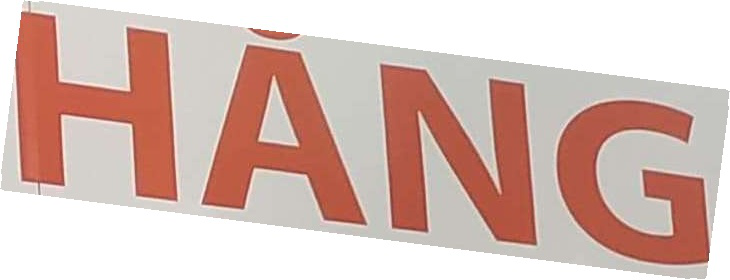

[([[35.042847874454296, -21.98167047674281], [745.7998679077103, 85.8430154007158], [699.9571521255457, 288.9816704767428], [-10.799867907710365, 182.15698459928421]], 'HANG', 0.36137208342552185)]


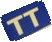

[([[8, 8], [44, 8], [44, 40], [8, 40]], 'v', 0.12462849169969559)]


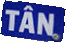

[([[0, 3], [63, 3], [63, 41], [0, 41]], 'IÂN', 0.5530402064323425)]


In [ ]:
import easyocr
reader = easyocr.Reader(['vi']) # need to run only once to load model into memory
import os

data_path = '/content/Result/Crop Words/'
imgs_path = os.listdir(data_path)
for img_path in imgs_path:
    img = Image.open(os.path.join(data_path, img_path))
    display(img)
    result = reader.readtext(os.path.join(data_path, img_path))
    print(result)
